### Import

In [ ]:
# from google.colab import files
import numpy as np
import tensorflow as tf
import keras
import cv2
from keras.layers import MaxPool2D, Conv2D, UpSampling2D, Input, Dropout
from keras.models import Sequential
from keras.preprocessing.image import img_to_array
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

# import pycocotools
import random
from keras.callbacks import EarlyStopping
from PIL import Image
import skimage
from skimage import color, io
import h5py
from sklearn.model_selection import train_test_split

from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras import layers
from tensorflow.keras.models import Model

from skimage.color import lab2rgb, rgb2lab
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_absolute_error
import skimage

# set the random seeds
os.environ["TF_CUDNN_DETERMINISTIC"] = "1"
random.seed(hash("setting random seeds") % 2**32 - 1)
np.random.seed(hash("improves reproducibility") % 2**32 - 1)
tf.random.set_seed(hash("by removing stochasticity") % 2**32 - 1)

In [ ]:
# Defining Input
input_folder = "/kaggle/input/landscape-pictures"
# input_folder = '../input/coco2014-train/train2014'
# input_folder = '../input/animals10/raw-img/cane'

output_folder = "/kaggle/working/landscape-pictures-gray"
# output_folder = '/kaggle/working/coco-pictures-gray'
# output_folder = '/kaggle/working/dog-pictures-gray'

grayscale_images_path = output_folder
color_path = input_folder
color_mode = "RGB"  # or "LAB"
num_img = 5000  #
simpler = False  # or False

### Weights and Bias setup

In [3]:
# !pip install shortuuid==1.0.1
!pip install wandb
!pip install pygments

/usr/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [ ]:
import wandb
from wandb.integration.keras import (
    WandbMetricsLogger,
    WandbModelCheckpoint,
    WandbEvalCallback,
    WandbCallback,
)

wandb.login(key="c90a14abf710ba48770b63e9815691368e933523")  # Lu's API

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: luisa-weisch (luisa-weisch-metsystem). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

### Model Configuration

In [ ]:
config = {
    "learning_rate": 0.001,
    "epochs": 2,
    "batch_size": 32,
    "loss_function": "mean_absolute_error",
    "architecture": "CNN",
    "optimizer": "Adam",
}

In [ ]:
# Print available devices
print("Available devices:")
print(tf.config.list_physical_devices("GPU"))

# Check if TensorFlow is using the GPU
if tf.test.is_gpu_available():
    print("TensorFlow is using the GPU.")
else:
    print("TensorFlow is using only the CPU.")

Available devices:
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]
TensorFlow is using the GPU.


In [ ]:
# Create the output folder if it does not exist
os.makedirs(output_folder, exist_ok=True)

# Read the images from the input folder
image_files = [
    f for f in os.listdir(input_folder) if f.endswith(("jpg", "jpeg", "png"))
][:5000]


print(f"Trovate {len(image_files)} immagini nella cartella {input_folder}.")

# Iter over the images and convert them to grayscale
for image_file in image_files:
    input_path = os.path.join(input_folder, image_file)
    output_path = os.path.join(output_folder, image_file)

    # Open image and convert it to grayscale
    with Image.open(input_path) as img:
        grayscale_img = img.convert("L")
        grayscale_img.save(output_path)

print(f"Immagini convertite in grayscale e salvate in {output_folder}.")
grayscale_images_path = output_folder
color_path = input_folder

Trovate 4319 immagini nella cartella /kaggle/input/landscape-pictures.
Immagini convertite in grayscale e salvate in /kaggle/working/landscape-pictures-gray.


## Create Dataset

In [ ]:
# Dataset Preperation for RGB Model
def create_dataset_rgb(color_images_path, grayscale_image_files):
    # Get sorted lists of image file paths
    color_image_files = sorted(
        [
            os.path.join(color_images_path, f)
            for f in os.listdir(color_images_path)
            if f.endswith(("jpg", "png", "jpeg"))
        ]
    )
    grayscale_image_files = sorted(
        [
            os.path.join(grayscale_images_path, f)
            for f in os.listdir(grayscale_images_path)
            if f.endswith(("jpg", "png", "jpeg"))
        ]
    )

    # Ensure the filenames without paths are used for matching
    color_filenames = {os.path.basename(f): f for f in color_image_files}
    grayscale_filenames = {os.path.basename(f): f for f in grayscale_image_files}

    # Match pairs based on filenames
    paired_filenames = [
        (grayscale_filenames[f], color_filenames[f])
        for f in grayscale_filenames
        if f in color_filenames
    ]

    # Check if pairs were created correctly
    print(f"Number of pairs created: {len(paired_filenames)}")

    # Function to load and preprocess images
    def load_image(image_path, color_mode="rgb", target_size=(160, 160)):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_image(
            image, channels=3 if color_mode == "rgb" else 1, expand_animations=False
        )
        image = tf.image.resize(image, target_size)
        image = image / 255.0  # Normalize to [0, 1]
        if color_mode == "grayscale":
            image = tf.image.grayscale_to_rgb(
                image
            )  # Ensure grayscale images have 3 channels
        return image

    # Create a dataset from the paired filenames
    grayscale_paths, color_paths = zip(*paired_filenames)

    grayscale_paths = list(grayscale_paths)
    color_paths = list(color_paths)

    # Split the dataset into train (80%), validation (10%), and test (10%) sets
    train_size = int(len(grayscale_paths) * 0.80)
    val_size = int(len(grayscale_paths) * 0.10)
    test_size = len(grayscale_paths) - train_size - val_size

    print(f"train len: {train_size}, validation len:{val_size}, test len:{test_size}")

    train_grayscale_paths = grayscale_paths[:train_size]
    val_grayscale_paths = grayscale_paths[train_size : train_size + val_size]
    test_grayscale_paths = grayscale_paths[train_size + val_size :]

    train_color_paths = color_paths[:train_size]
    val_color_paths = color_paths[train_size : train_size + val_size]
    test_color_paths = color_paths[train_size + val_size :]

    # Create the train, validation, and test datasets
    train_grayscale_ds = tf.data.Dataset.from_tensor_slices(train_grayscale_paths).map(
        lambda x: load_image(x, color_mode="grayscale"),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    train_color_ds = tf.data.Dataset.from_tensor_slices(train_color_paths).map(
        lambda x: load_image(x, color_mode="rgb"), num_parallel_calls=tf.data.AUTOTUNE
    )

    val_grayscale_ds = tf.data.Dataset.from_tensor_slices(val_grayscale_paths).map(
        lambda x: load_image(x, color_mode="grayscale"),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    val_color_ds = tf.data.Dataset.from_tensor_slices(val_color_paths).map(
        lambda x: load_image(x, color_mode="rgb"), num_parallel_calls=tf.data.AUTOTUNE
    )

    test_grayscale_ds = tf.data.Dataset.from_tensor_slices(test_grayscale_paths).map(
        lambda x: load_image(x, color_mode="grayscale"),
        num_parallel_calls=tf.data.AUTOTUNE,
    )
    test_color_ds = tf.data.Dataset.from_tensor_slices(test_color_paths).map(
        lambda x: load_image(x, color_mode="rgb"), num_parallel_calls=tf.data.AUTOTUNE
    )

    # Combine both datasets into a single dataset of pairs for train, validation, and test
    train_dataset = tf.data.Dataset.zip((train_grayscale_ds, train_color_ds))
    val_dataset = tf.data.Dataset.zip((val_grayscale_ds, val_color_ds))
    test_dataset = tf.data.Dataset.zip((test_grayscale_ds, test_color_ds))

    # Shuffle, batch, and prefetch the data for efficient training
    train_dataset = (
        train_dataset.shuffle(buffer_size=1000)
        .batch(config["batch_size"])
        .prefetch(buffer_size=tf.data.AUTOTUNE)
    )
    val_dataset = val_dataset.batch(config["batch_size"]).prefetch(
        buffer_size=tf.data.AUTOTUNE
    )
    test_dataset = test_dataset.batch(config["batch_size"]).prefetch(
        buffer_size=tf.data.AUTOTUNE
    )

    return train_dataset, val_dataset, test_dataset

### Preprocessing images

In [ ]:
# Dataset for LAB Model
def preprocess_image(image_path, target_size=(160, 160)):
    # Load image and convert to RGB
    img = load_img(image_path, target_size=target_size)
    img = np.array(img)  # Convert to NumPy array

    # Convert to Lab color space
    lab_image = color.rgb2lab(img)

    # Extract the L, a, and b channels
    l_channel = lab_image[:, :, 0] / 100.0  # Normalize L channel to [0, 1]
    a_channel = lab_image[:, :, 1] / 128.0  # Normalize a channel to [-1, 1]
    b_channel = lab_image[:, :, 2] / 128.0  # Normalize b channel to [-1, 1]

    # Stack L channel as input, and a,b channels as output
    input_data = np.expand_dims(l_channel, axis=-1)  # Shape (160, 160, 1)
    output_data = np.stack([a_channel, b_channel], axis=-1)  # Shape (160, 160, 2)

    return input_data, output_data


def create_dataset_lab(image_folder, target_size=(160, 160), num_img=np.inf):
    input_images = []
    output_images = []
    num_img = min(num_img, len(os.listdir(image_folder)))

    # Iterate through all images in the folder
    for image_name in os.listdir(image_folder)[:num_img]:
        if image_name.endswith(("jpg", "jpeg", "png")):  # Only process image files
            image_path = os.path.join(image_folder, image_name)
            input_data, output_data = preprocess_image(image_path, target_size)

            # Append the data to lists
            input_images.append(input_data)
            output_images.append(output_data)

    return input_images, output_images

In [ ]:
if color_mode == "RGB":
    train_dataset, val_dataset, test_dataset = create_dataset_rgb(
        color_path, grayscale_images_path
    )

elif color_mode == "LAB":
    input_images, output_images = create_dataset_lab(input_folder, num_img=num_img)

    # Convert lists to numpy arrays
    input_images = np.array(input_images)
    output_images = np.array(output_images)

    # First, split into training and temp (temp will be further split into validation and test)
    X_train, X_temp, y_train, y_temp = train_test_split(
        input_images, output_images, test_size=0.3, random_state=42
    )

    # Split the temp dataset into validation and test sets
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.5, random_state=42
    )

    # X -> L channel
    # y -> AB channels
    print(f"Training set: {X_train.shape}, {y_train.shape}")
    print(f"Validation set: {X_val.shape}, {y_val.shape}")
    print(f"Test set: {X_test.shape}, {y_test.shape}")

Number of pairs created: 4319
train len: 3455, validation len:431, test len:433


## Definig Models

In [ ]:
# 1st model (simpler)
def simpler_model():
    inputs = layers.Input(shape=[160, 160, 3])

    # Downsampling
    d1 = layers.Conv2D(64, (3, 3), padding="same", strides=2, activation="relu")(inputs)

    d2 = layers.Conv2D(128, (3, 3), padding="same", strides=2, activation="relu")(d1)

    # Bottleneck
    bottleneck = layers.Conv2D(256, (3, 3), padding="same", activation="relu")(d2)

    # Upsampling
    u1 = layers.Conv2DTranspose(
        128, (3, 3), padding="same", strides=2, activation="relu"
    )(bottleneck)
    u2 = layers.Conv2DTranspose(
        64, (3, 3), padding="same", strides=2, activation="relu"
    )(u1)

    # Output layer
    output = layers.Conv2D(3, (3, 3), padding="same", activation="sigmoid")(u2)

    return tf.keras.Model(inputs=inputs, outputs=output)

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 160, 160, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 80, 80, 64)          │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 40, 40, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 40, 40, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose (Conv2DTranspose)   │ (None, 80, 80, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_transpose_1 (Conv2DTranspose) │ (None, 160, 160, 64)        │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 160, 160, 3)         │           1,731 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 741,379 (2.83 MB)

 Trainable params: 741,379 (2.83 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# 2nd model (RGB)
def rgb_model():
    # Input layer
    inputs = layers.Input(
        shape=[160, 160, 1]
    )  # Grayscale image as input (160x160, 1 channel)

    # Downsampling (Encoder)
    d1 = layers.Conv2D(128, (3, 3), padding="same", strides=2)(
        inputs
    )  # Image shape = (80, 80, 128)
    d1 = layers.BatchNormalization()(d1)
    d1 = layers.LeakyReLU()(d1)

    d2 = layers.Conv2D(128, (3, 3), padding="same", strides=2)(
        d1
    )  # Image shape = (40, 40, 128)
    d2 = layers.BatchNormalization()(d2)
    d2 = layers.LeakyReLU()(d2)

    d3 = layers.Conv2D(256, (3, 3), padding="same", strides=2)(
        d2
    )  # Image shape = (20, 82, 256)
    d3 = layers.BatchNormalization()(d3)
    d3 = layers.LeakyReLU()(d3)

    d4 = layers.Conv2D(512, (3, 3), padding="same", strides=2)(
        d3
    )  # Image shape = (10, 10, 512)
    d4 = layers.BatchNormalization()(d4)
    d4 = layers.LeakyReLU()(d4)

    d5 = layers.Conv2D(512, (3, 3), padding="same", strides=2)(
        d4
    )  # Image shape = (5, 5, 512) <- Latent Space
    d5 = layers.BatchNormalization()(d5)
    d5 = layers.LeakyReLU()(d5)

    # Upsampling (Decoder)
    u1 = layers.Conv2DTranspose(512, (3, 3), padding="same", strides=2)(
        d5
    )  # Image shape = (5, 5, 512)
    u1 = layers.LeakyReLU()(u1)
    u1 = layers.concatenate([u1, d4])

    u2 = layers.Conv2DTranspose(256, (3, 3), padding="same", strides=2)(
        u1
    )  # Image shape = (20, 80, 256)
    u2 = layers.LeakyReLU()(u2)
    u2 = layers.concatenate([u2, d3])

    u3 = layers.Conv2DTranspose(128, (3, 3), padding="same", strides=2)(
        u2
    )  # Image shape = (40, 40, 128)
    u3 = layers.LeakyReLU()(u3)
    u3 = layers.concatenate([u3, d2])

    u4 = layers.Conv2DTranspose(128, (3, 3), padding="same", strides=2)(
        u3
    )  # Image shape = (80, 80, 128)
    u4 = layers.LeakyReLU()(u4)
    u4 = layers.concatenate([u4, d1])

    u5 = layers.Conv2DTranspose(3, (3, 3), padding="same", strides=2)(
        u4
    )  # Image shape = (160, 160, 3)
    u5 = layers.concatenate([u5, inputs])

    # Final Conv2D layer to produce the output (e.g., predicted 'rgb' channels)
    output = layers.Conv2D(3, (2, 2), strides=1, padding="same")(
        u5
    )  # Output 'r' 'g' and 'b' channels | Image shape = (160, 160, 2)

    # Create the model
    model = Model(inputs=inputs, outputs=output)
    return model

In [ ]:
# 3rd model (LAB)
def lab_model():
    # Input layer
    inputs = layers.Input(
        shape=[160, 160, 1]
    )  # Grayscale image as input (160x160, 1 channel)

    # Downsampling (Encoder)
    d1 = layers.Conv2D(128, (3, 3), padding="same", strides=2)(
        inputs
    )  # Image shape = (80, 80, 128)
    d1 = layers.BatchNormalization()(d1)
    d1 = layers.LeakyReLU()(d1)

    d2 = layers.Conv2D(128, (3, 3), padding="same", strides=2)(
        d1
    )  # Image shape = (40, 40, 128)
    d2 = layers.BatchNormalization()(d2)
    d2 = layers.LeakyReLU()(d2)

    d3 = layers.Conv2D(256, (3, 3), padding="same", strides=2)(
        d2
    )  # Image shape = (20, 82, 256)
    d3 = layers.BatchNormalization()(d3)
    d3 = layers.LeakyReLU()(d3)

    d4 = layers.Conv2D(512, (3, 3), padding="same", strides=2)(
        d3
    )  # Image shape = (10, 10, 512)
    d4 = layers.BatchNormalization()(d4)
    d4 = layers.LeakyReLU()(d4)

    d5 = layers.Conv2D(512, (3, 3), padding="same", strides=2)(
        d4
    )  # Image shape = (5, 5, 512) <- Latent Space
    d5 = layers.BatchNormalization()(d5)
    d5 = layers.LeakyReLU()(d5)

    # Upsampling (Decoder)
    u1 = layers.Conv2DTranspose(512, (3, 3), padding="same", strides=2)(
        d5
    )  # Image shape = (5, 5, 512)
    u1 = layers.LeakyReLU()(u1)
    u1 = layers.concatenate([u1, d4])

    u2 = layers.Conv2DTranspose(256, (3, 3), padding="same", strides=2)(
        u1
    )  # Image shape = (20, 80, 256)
    u2 = layers.LeakyReLU()(u2)
    u2 = layers.concatenate([u2, d3])

    u3 = layers.Conv2DTranspose(128, (3, 3), padding="same", strides=2)(
        u2
    )  # Image shape = (40, 40, 128)
    u3 = layers.LeakyReLU()(u3)
    u3 = layers.concatenate([u3, d2])

    u4 = layers.Conv2DTranspose(128, (3, 3), padding="same", strides=2)(
        u3
    )  # Image shape = (80, 80, 128)
    u4 = layers.LeakyReLU()(u4)
    u4 = layers.concatenate([u4, d1])

    u5 = layers.Conv2DTranspose(
        3, (3, 3), padding="same", strides=2, activation="tanh"
    )(
        u4
    )  # Image shape = (160, 160, 2)
    u5 = layers.concatenate([u5, inputs])

    # Final Conv2D layer to produce the output (e.g., predicted 'ab' channels)
    output = layers.Conv2D(2, (2, 2), strides=1, padding="same")(
        u5
    )  # Output 'a' and 'b' channels | Image shape = (160, 160, 2)

    # Create the model
    model = Model(inputs=inputs, outputs=output)
    return model


# Create and summarize the model
if color_mode == "RGB":
    if simpler:
        model = simpler_model()
    else:
        model = rgb_model()
elif color_mode == "LAB":
    model = lab_model()

model.summary()

## Training

In [ ]:
import datetime


timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")



# Peak Signal-to-Noise Ratio PSNR

def psnr(y_true, y_pred):

    return tf.image.psnr(y_true, y_pred, max_val=1.0)



# Structural Similarity Index (SSIM)

def ssim(y_true, y_pred):

    return tf.image.ssim(y_true, y_pred, max_val=1.0)



# Initialize wandb

run = wandb.init(project="Final results", config=config)


config = wandb.config


model.compile(
    optimizer=config.optimizer,
    loss=config.loss_function,

    metrics=[
        "acc",

        "mae",  # mean absolute error

        "mse",  # mean squared error
        psnr,
        ssim,

    ],
)


run.name = f"lr_{config.learning_rate}_epochs_{config.epochs}_batch_{config.batch_size}_{config.optimizer}_loss_{config.loss_function}_{timestamp}"

In [ ]:
callbacks = [
    WandbMetricsLogger(),  # Log of basic metrics like loss and accuracy
    WandbModelCheckpoint(
        filepath="/kaggle/working/model-best.keras",  # Nome file per il miglior modello
        monitor="val_loss",  # Monitorare la validazione della perdita
        mode="min",  # Minimizziamo la perdita
        save_best_only=True,  # Salva solo il miglior modello
        save_weights_only=False,  # Salva il modello completo
    ),
    EarlyStopping(
        monitor="val_loss",  # Monitor validation loss
        patience=20,  # Stop after n epochs of no improvement
        mode="min",  # We want to minimize validation loss
        restore_best_weights=True,  # Restore weights from the best epoch
    ),
]

if color_mode == "RGB":
    model.fit(
        train_dataset,
        epochs=config.epochs,
        validation_data=val_dataset,
        callbacks=[callbacks],
    )

elif color_mode == "LAB":
    model.fit(
        X_train,
        y_train,
        validation_data=(X_val, y_val),
        epochs=config.epochs,
        batch_size=config.batch_size,
        callbacks=callbacks,
    )

    # Predict on a test or validation image
    test_images = X_test[:]  # Example image from validation set
    predictions = []
    l_components = []
    for test_image in test_images:
        l_components.append(test_image)
        predictions.append(
            model.predict(np.expand_dims(test_image, axis=0))[0]
        )  # Predict for the single image

wandb: WARNING When using `save_best_only`, ensure that the `filepath` argument contains formatting placeholders like `{epoch:02d}` or `{batch:02d}`. This ensures correct interpretation of the logged artifacts.


Epoch 1/2
108/108 ━━━━━━━━━━━━━━━━━━━━ 34s 217ms/step - acc: 0.3696 - loss: 0.1713 - mae: 0.1713 - mse: 0.0484 - psnr: 14.2501 - ssim: 0.3894 - val_acc: 0.3922 - val_loss: 0.0911 - val_mae: 0.0911 - val_mse: 0.0175 - val_psnr: 18.6763 - val_ssim: 0.5672
Epoch 2/2
108/108 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - acc: 0.3733 - loss: 0.0911 - mae: 0.0911 - mse: 0.0173 - psnr: 18.6259 - ssim: 0.6114 - val_acc: 0.4779 - val_loss: 0.0811 - val_mae: 0.0811 - val_mse: 0.0149 - val_psnr: 19.5396 - val_ssim: 0.6391


## Plotting Results


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 437ms/step


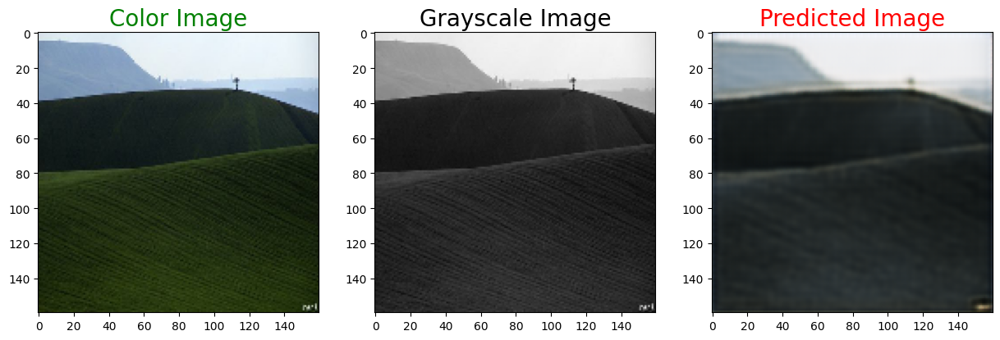

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


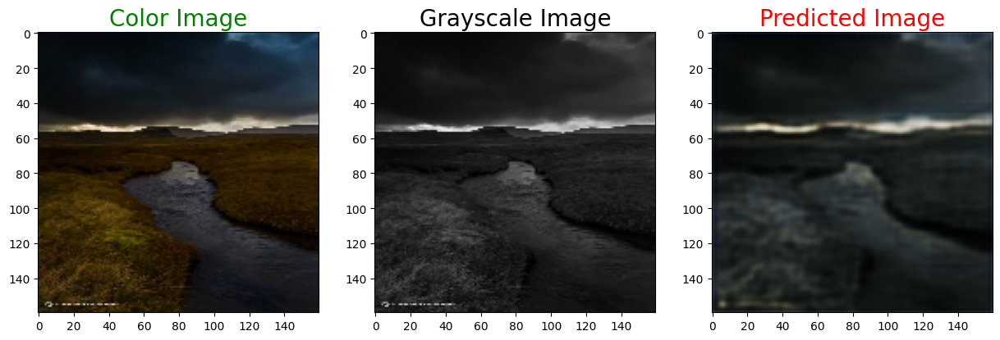

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


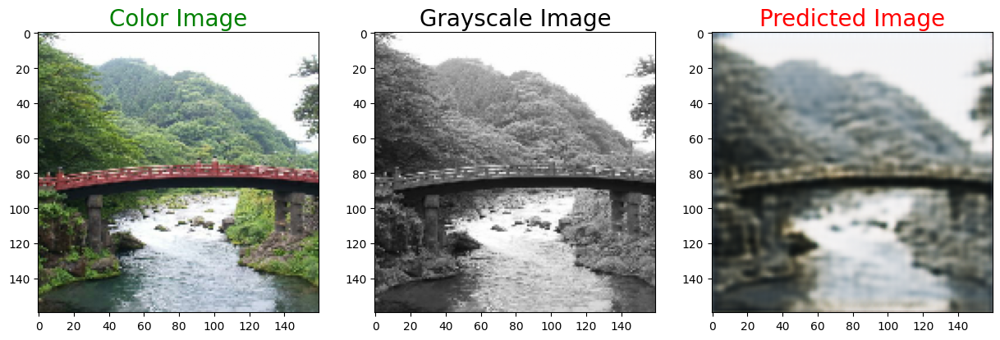

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


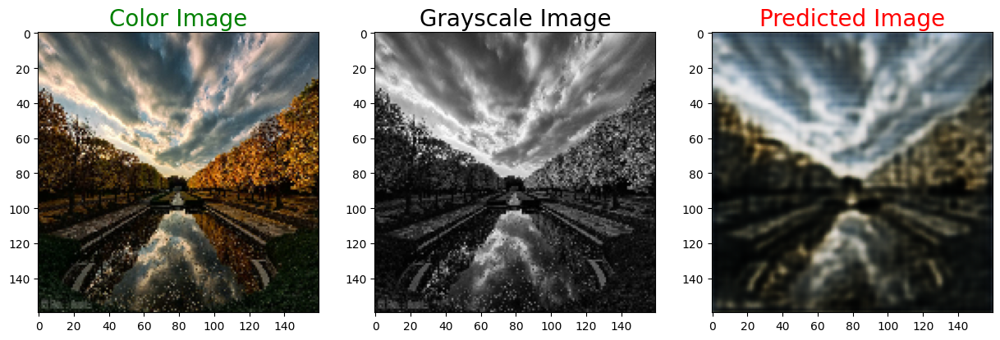

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


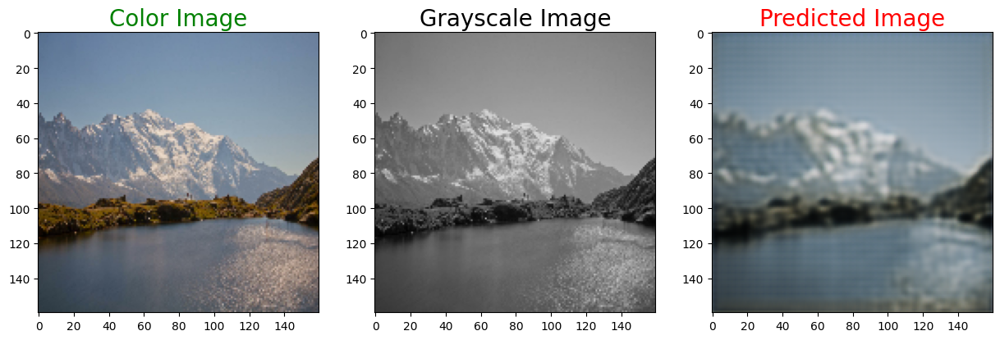

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


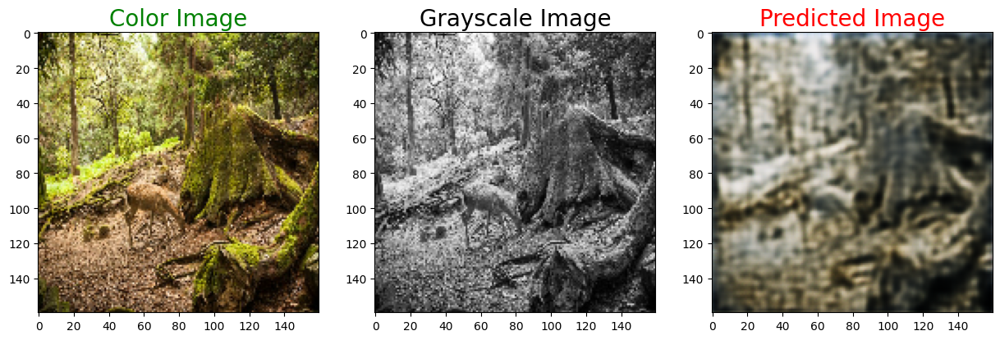

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


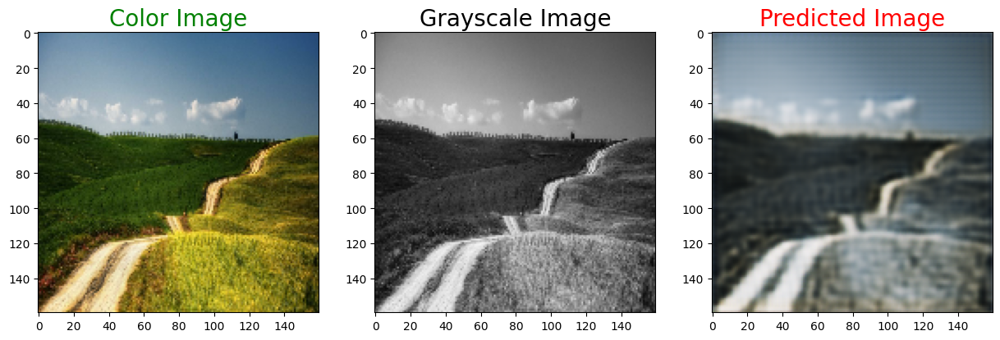

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


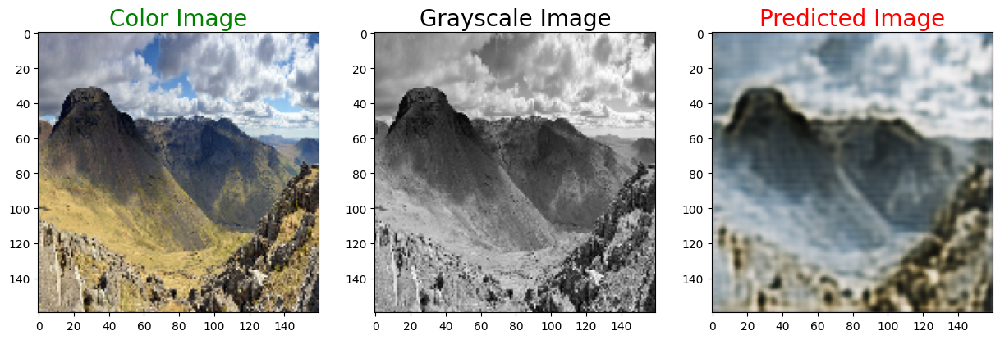

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


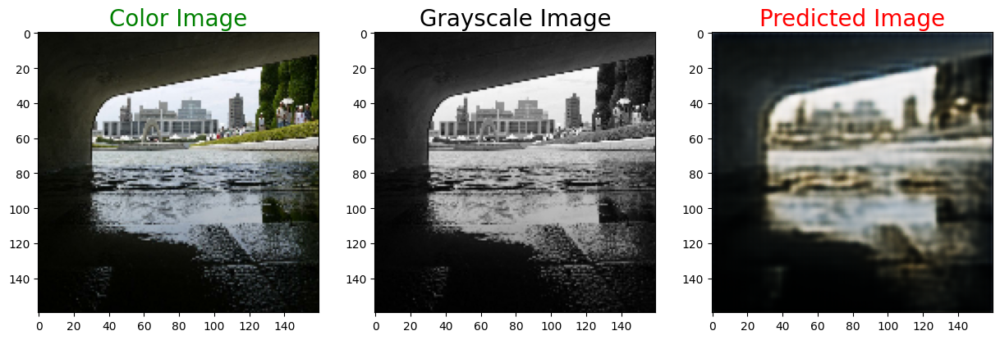

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


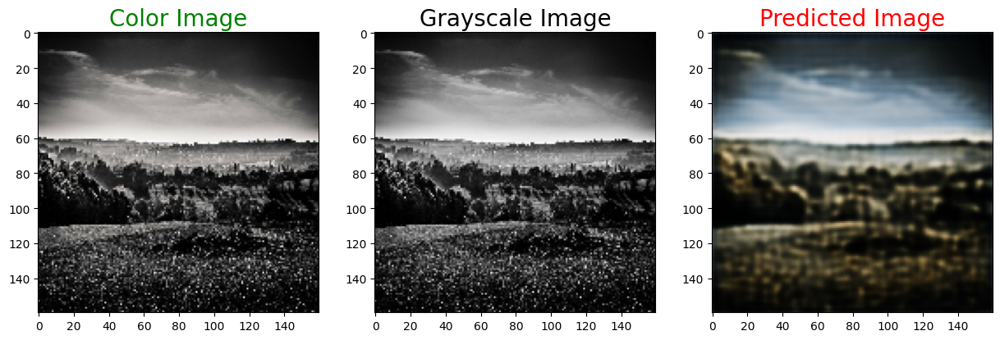

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


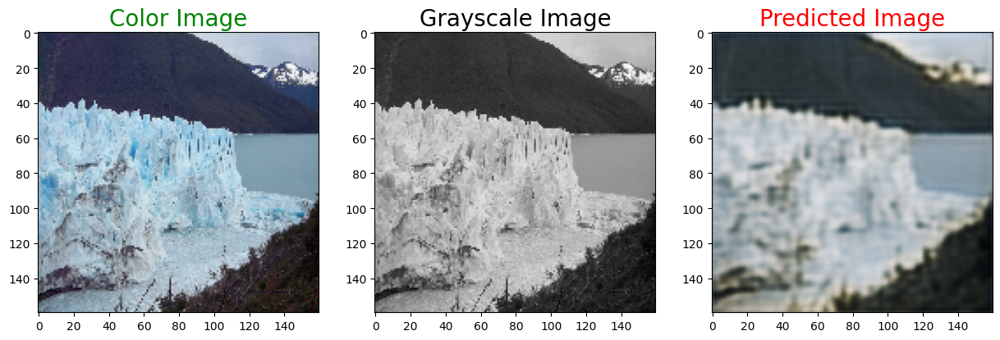

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


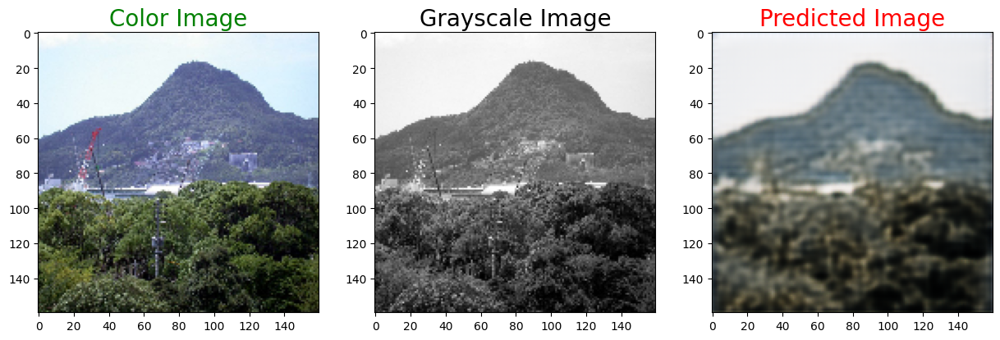

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


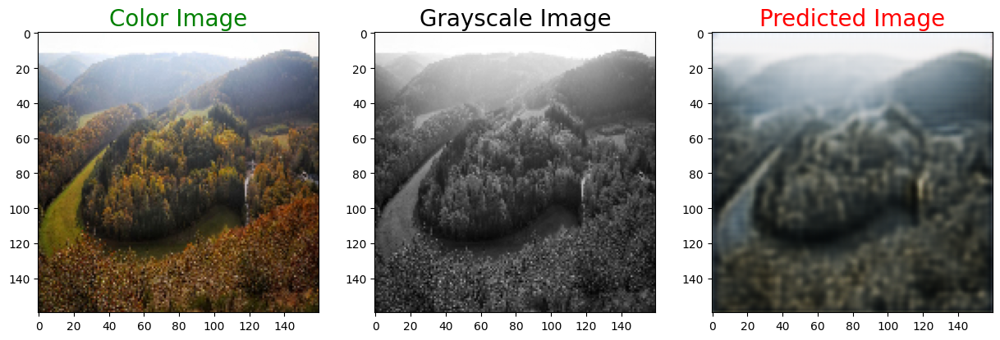

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


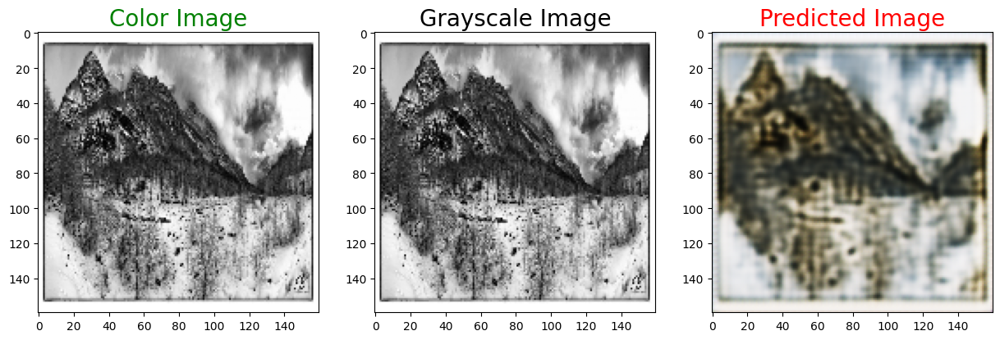

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


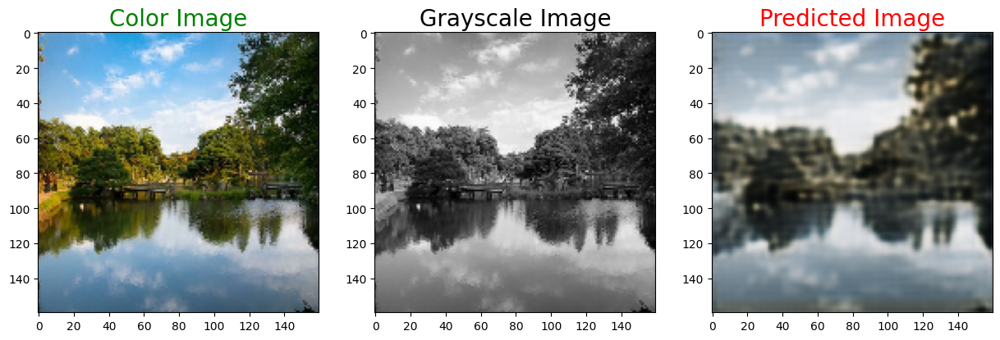

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


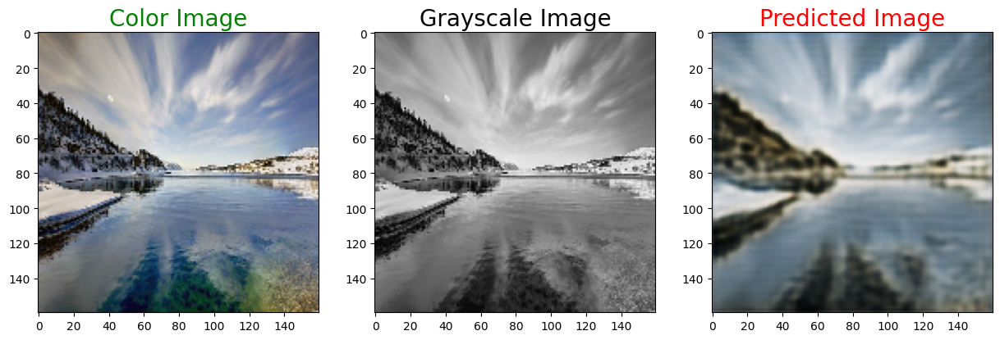

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


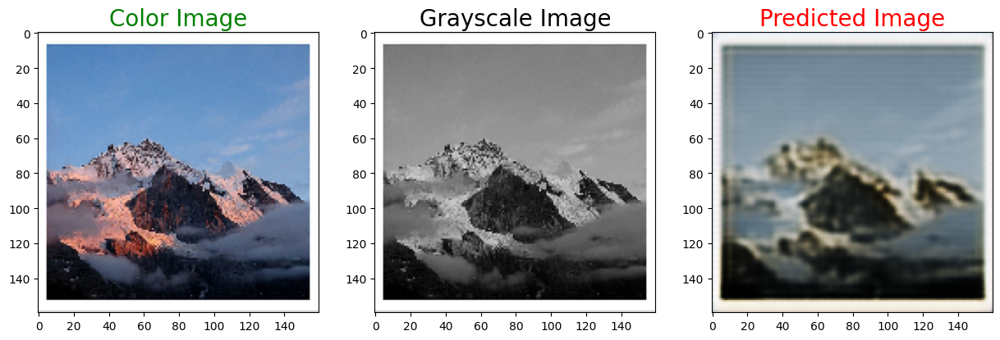

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


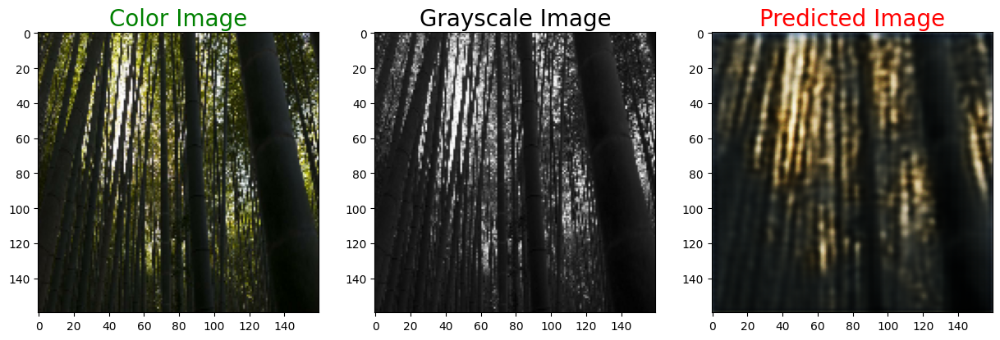

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


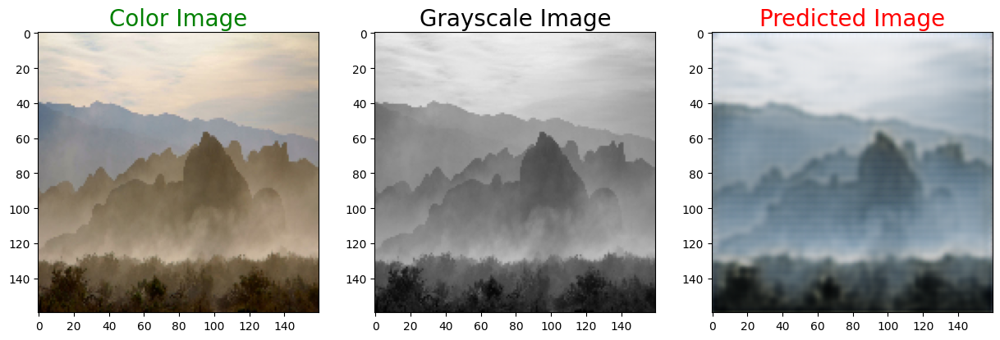

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


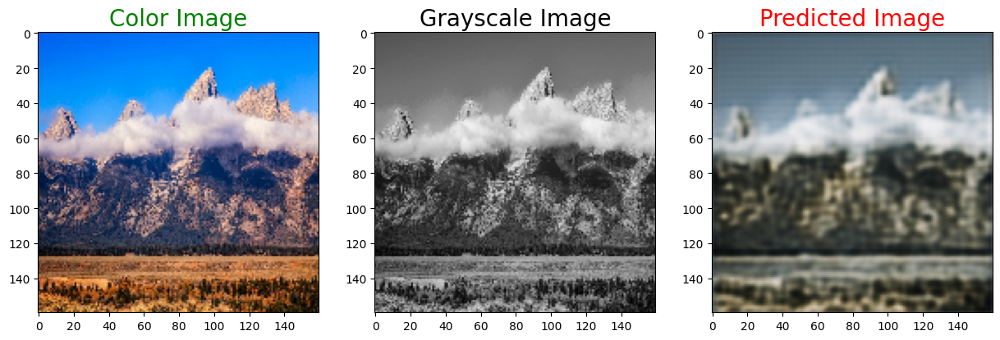

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


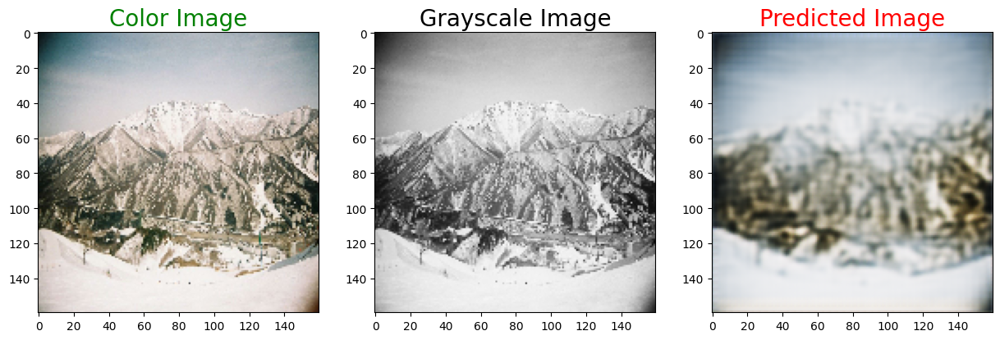

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


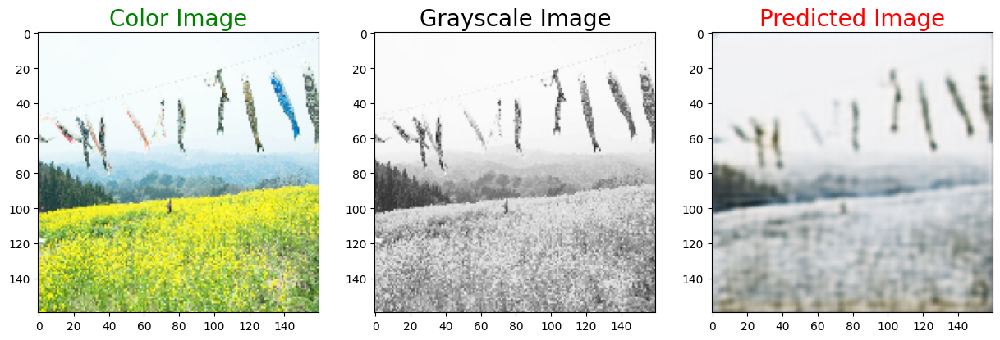

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


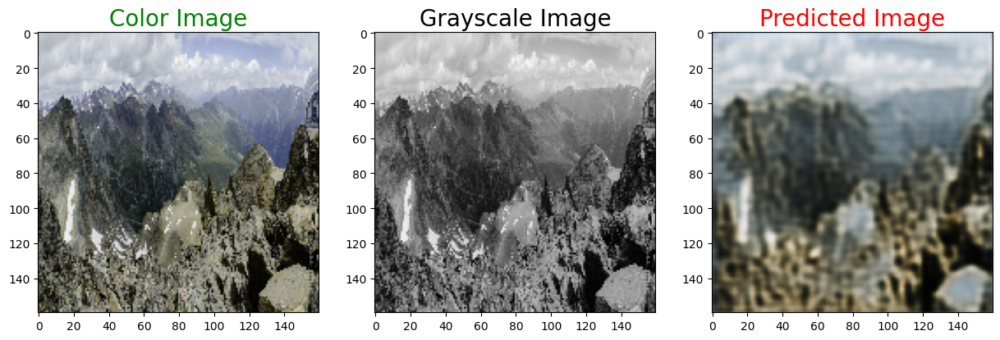

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


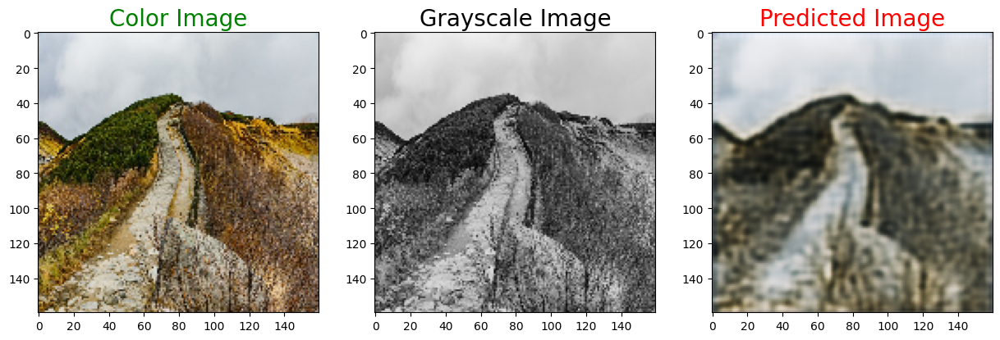

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


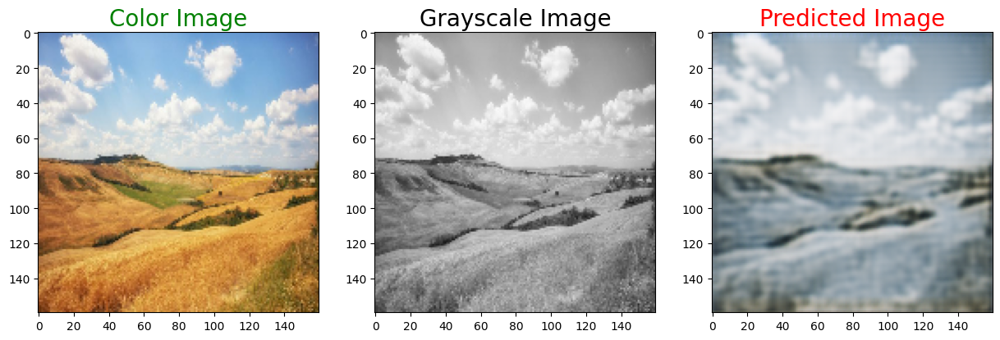

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


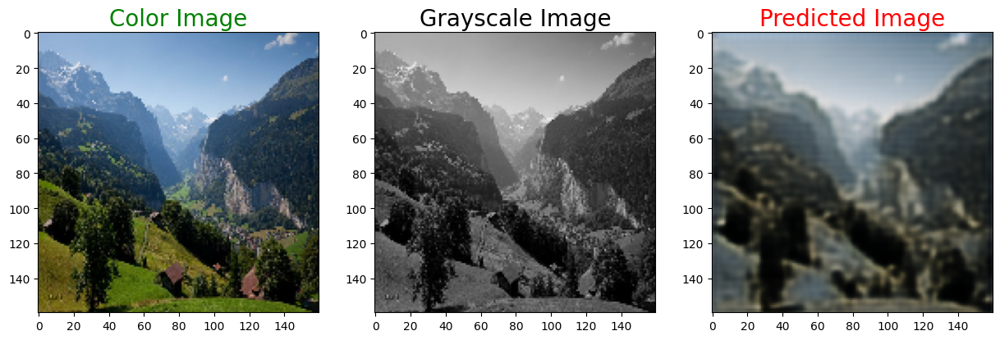

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


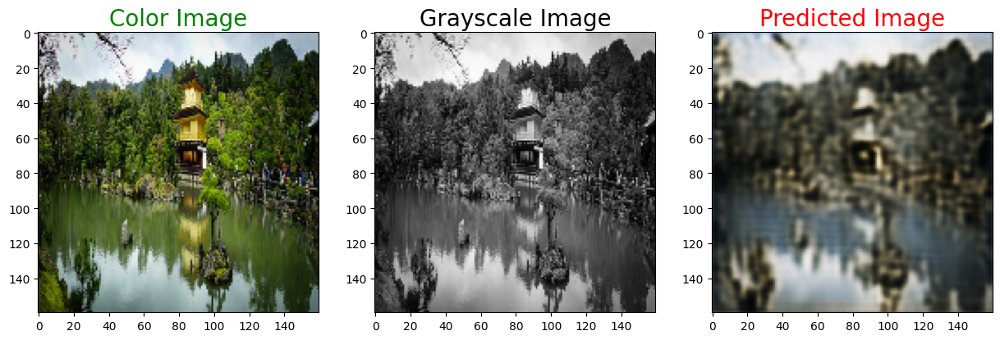

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


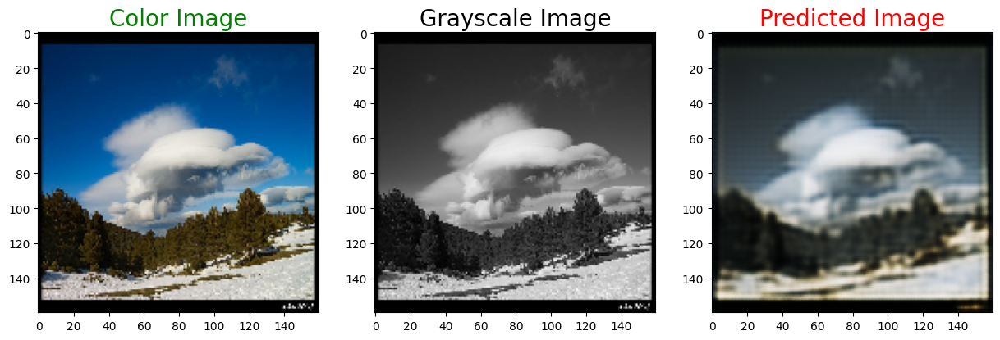

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


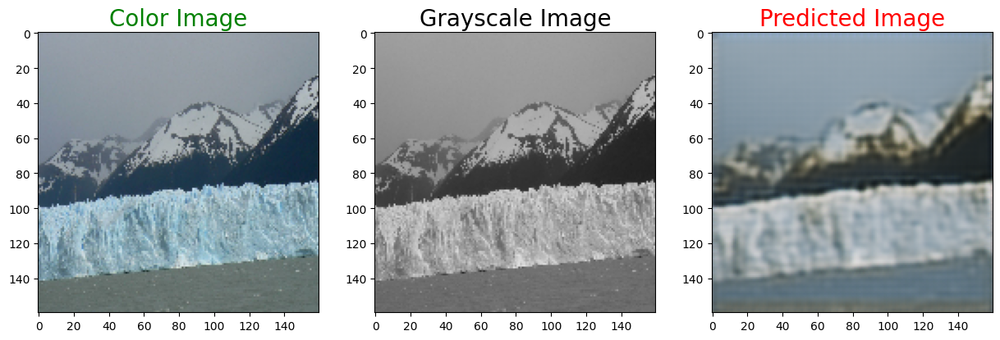

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


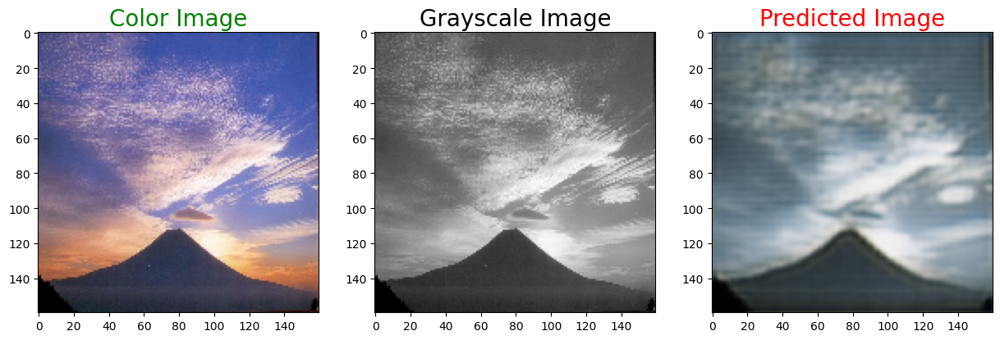

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


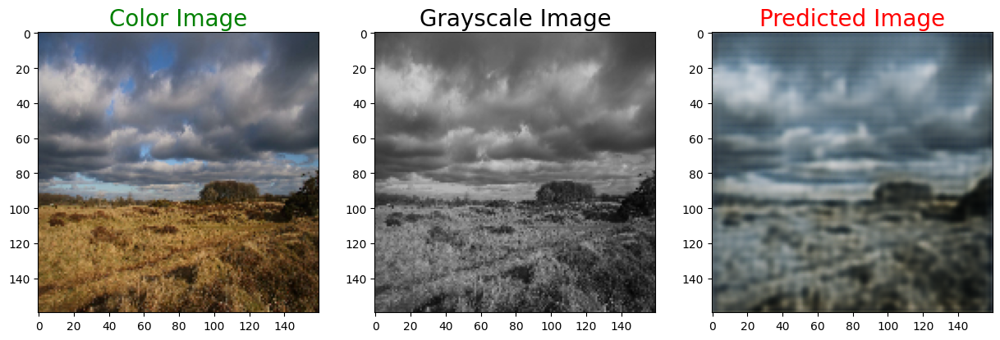

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


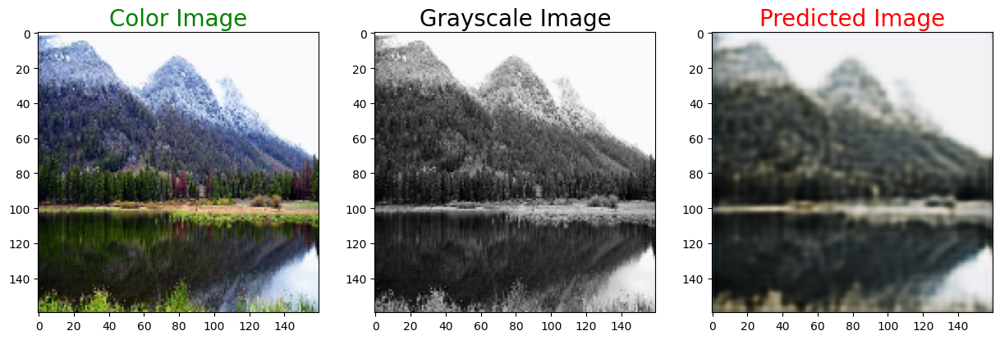

14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 214ms/step - acc: 0.4751 - loss: 0.0786 - mae: 0.0786 - mse: 0.0141 - psnr: 19.7313 - ssim: 0.6457
Test Loss: 0.0786682516336441
Test PSNR: 19.803300857543945
Test SSIM: 0.6472771763801575


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import wandb

# from wandb.keras import WandbCallback


# RGB
def plot_images(color, grayscale, predicted):
    plt.figure(figsize=(15, 15))

    plt.subplot(1, 3, 1)
    plt.title("Color Image", color="green", fontsize=20)
    plt.imshow(color)

    plt.subplot(1, 3, 2)
    plt.title("Grayscale Image", color="black", fontsize=20)
    plt.imshow(grayscale)

    plt.subplot(1, 3, 3)
    plt.title("Predicted Image", color="Red", fontsize=20)
    plt.imshow(predicted)

    wandb.log(
        {
            # "color_image": wandb.Image(color),
            # "grayscale_image": wandb.Image(grayscale),
            # "predicted_image": wandb.Image(predicted),
            "predicted_images_plot": plt
        }
    )

    plt.show()


if color_mode == "RGB":
    SIZE = 160
    for grayscale_batch, color_batch in test_dataset.take(1):  # Prendi un batch
        for i in range(len(grayscale_batch)):

            grayscale_image = grayscale_batch[i]
            grayscale_image = tf.reshape(grayscale_image, (1, SIZE, SIZE, 3))

            # Previsione
            predicted = model.predict(grayscale_image)  # predizione sulla grayscale
            predicted = tf.clip_by_value(predicted, 0.0, 1.0)
            predicted = tf.reshape(predicted, (SIZE, SIZE, 3))

            plot_images(color_batch[i], grayscale_batch[i], predicted.numpy())

    # Fine della registrazione su wandb
    # wandb.finish()

    # test metrics RGB
    results = model.evaluate(test_dataset)

    test_loss = results[0]
    test_psnr = results[4]  # PSNR is metric n.5
    test_ssim = results[5]  # SSIM is metric n.6

    # Stampare i risultati
    print(f"Test Loss: {test_loss}")
    print(f"Test PSNR: {test_psnr}")
    print(f"Test SSIM: {test_ssim}")

    # Loggare su Wandb
    wandb.log({"test_loss": test_loss, "test_psnr": test_psnr, "test_ssim": test_ssim})

elif color_mode == "LAB":
    for idx in range(0, min(20, len(predictions))):
        L = l_components[idx][:, :, 0]
        a = predictions[idx][:, :, 0]
        b = predictions[idx][:, :, 1]

        a_true = y_test[idx][:, :, 0]
        b_true = y_test[idx][:, :, 1]

        # Stack the predicted a and b channels
        predicted_lab = np.stack((L * 100, a * 128, b * 128))
        predicted_lab = color.lab2rgb(predicted_lab.transpose(1, 2, 0))

        true_lab = np.stack((L * 100, a_true * 128, b_true * 128))
        true_lab = color.lab2rgb(true_lab.transpose(1, 2, 0))

        # Display the predicted RGB image
        plt.figure(figsize=(12, 6))

        # Plot the L component (lightness)
        plt.subplot(1, 3, 1)
        plt.imshow(true_lab)  # Display L component as grayscale
        plt.title("Color Image")
        plt.axis("off")

        # Plot a component
        plt.subplot(1, 3, 2)
        plt.imshow(L, cmap="gray")
        plt.title("L component")
        plt.axis("off")

        # Plot the b component
        plt.subplot(1, 3, 3)
        plt.imshow(predicted_lab)  # Display L component as grayscale
        plt.title("Predicted Image")
        plt.axis("off")

    # Helper function to compute PSNR
    def compute_psnr(true, pred):
        mse = np.mean((true - pred) ** 2)
        if mse == 0:  # Avoid divide by zero
            return float("inf")
        max_pixel = 1.0  # Assuming images are normalized [0, 1]
        return 20 * np.log10(max_pixel / np.sqrt(mse))

    # Reprocess predictions into LAB -> RGB
    # predictions = model.predict(X_test)  # Assuming model generates (a, b) channels

    test_losses = []
    test_psnrs = []
    test_ssims = []

    for i in range(len(X_test)):
        # Original grayscale (L) and ground truth (RGB)
        L_channel = X_test[i]  # Assuming X_test is the L channel (normalized [0, 1])
        true_ab = y_test[i]  # Assuming y_test contains original RGB images

        # Predicted a, b channels
        predicted_ab = predictions[i]

        # Combine L channel with predicted ab to form LAB
        lab_image_pred = np.zeros((L_channel.shape[0], L_channel.shape[1], 3))
        lab_image_pred[:, :, 0] = (
            np.squeeze(L_channel, axis=-1) * 100
        )  # Rescale L channel to [0, 100]
        lab_image_pred[:, :, 1] = (
            predicted_ab[:, :, 0] * 128
        )  # Rescale a, b channels to [-128, 127]
        lab_image_pred[:, :, 2] = (
            predicted_ab[:, :, 1] * 128
        )  # Rescale a, b channels to [-128, 127]

        # Combine L channel with true ab to form LAB
        lab_image_true = np.zeros((L_channel.shape[0], L_channel.shape[1], 3))
        lab_image_true[:, :, 0] = (
            np.squeeze(L_channel, axis=-1) * 100
        )  # Rescale L channel to [0, 100]
        lab_image_true[:, :, 1] = (
            true_ab[:, :, 0] * 128
        )  # Rescale a, b channels to [-128, 127]
        lab_image_true[:, :, 2] = (
            true_ab[:, :, 1] * 128
        )  # Rescale a, b channels to [-128, 127]

        # Convert LAB to RGB
        predicted_rgb = lab2rgb(
            lab_image_pred
        )  # Converts LAB to RGB (normalized [0, 1])
        true_rgb = lab2rgb(lab_image_true)

        # Normalize images if necessary
        true_rgb = true_rgb / 255.0 if true_rgb.max() > 1 else true_rgb
        predicted_rgb = (
            predicted_rgb / 255.0 if predicted_rgb.max() > 1 else predicted_rgb
        )

        # Compute metrics
        test_loss = mean_absolute_error(true_rgb.flatten(), predicted_rgb.flatten())
        test_psnr = compute_psnr(true_rgb, predicted_rgb)
        test_ssim, _ = ssim(
            true_rgb,
            predicted_rgb,
            multichannel=True,
            full=True,
            win_size=3,
            data_range=1.0,
        )

        # Store results
        test_losses.append(test_loss)
        test_psnrs.append(test_psnr)
        test_ssims.append(test_ssim)

    # Average metrics over the test set
    avg_test_loss = np.mean(test_losses)
    avg_test_psnr = np.mean(test_psnrs)
    avg_test_ssim = np.mean(test_ssims)

    # Print the final results
    print(f"Average Test Loss: {avg_test_loss}")
    print(f"Average Test PSNR: {avg_test_psnr}")
    print(f"Average Test SSIM: {avg_test_ssim}")

    # Log to Wandb
    wandb.log(
        {
            "avg_test_loss": avg_test_loss,
            "avg_test_psnr": avg_test_psnr,
            "avg_test_ssim": avg_test_ssim,
        }
    )